In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/zomato/zomato.csv


Top 5 Rows of the Dataset

In [2]:
df=pd.read_csv('/kaggle/input/zomato/zomato.csv')
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [3]:
df.shape

(51717, 17)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [5]:
df.drop_duplicates()
df=df.drop(columns=['url'])
df.shape

(51717, 16)

In [6]:
df['reviews_list'].head()

0    [('Rated 4.0', 'RATED\n  A beautiful place to ...
1    [('Rated 4.0', 'RATED\n  Had been here for din...
2    [('Rated 3.0', "RATED\n  Ambience is not that ...
3    [('Rated 4.0', "RATED\n  Great food and proper...
4    [('Rated 4.0', 'RATED\n  Very good restaurant ...
Name: reviews_list, dtype: object

In [7]:
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [8]:
def rateClean(col):
    if col=='NEW' or col=='-':
        return np.nan
    else:
        splt=str(col).split('/')
        col=splt[0]
        return float(col)

In [9]:
df['rate']=df['rate'].apply(rateClean)
df['rate'].unique()

array([4.1, 3.8, 3.7, 3.6, 4.6, 4. , 4.2, 3.9, 3.1, 3. , 3.2, 3.3, 2.8,
       4.4, 4.3, nan, 2.9, 3.5, 2.6, 3.4, 4.5, 2.5, 2.7, 4.7, 2.4, 2.2,
       2.3, 4.8, 4.9, 2.1, 2. , 1.8])

In [10]:
df['rate'].fillna(value=df['rate'].mean(), inplace=True)
df['rate'].unique()

array([4.1       , 3.8       , 3.7       , 3.6       , 4.6       ,
       4.        , 4.2       , 3.9       , 3.1       , 3.        ,
       3.2       , 3.3       , 2.8       , 4.4       , 4.3       ,
       3.70044882, 2.9       , 3.5       , 2.6       , 3.4       ,
       4.5       , 2.5       , 2.7       , 4.7       , 2.4       ,
       2.2       , 2.3       , 4.8       , 4.9       , 2.1       ,
       2.        , 1.8       ])

In [11]:
df.rename(columns={'approx_cost(for two people)':'2_plate_cost', 'reviews_list':'reviews', 'listed_in(city)':'area', 'listed_in(type)':'listed_type'}, inplace=True)
df.head()

,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,2_plate_cost,reviews,menu_item,listed_type,area
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [12]:
df['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Nagarbhavi', 'Bannerghatta Road', 'BTM', 'Kanakapura Road',
       'Bommanahalli', nan, 'CV Raman Nagar', 'Electronic City', 'HSR',
       'Marathahalli', 'Sarjapur Road', 'Wilson Garden', 'Shanti Nagar',
       'Koramangala 5th Block', 'Koramangala 8th Block', 'Richmond Road',
       'Koramangala 7th Block', 'Jalahalli', 'Koramangala 4th Block',
       'Bellandur', 'Whitefield', 'East Bangalore', 'Old Airport Road',
       'Indiranagar', 'Koramangala 1st Block', 'Frazer Town', 'RT Nagar',
       'MG Road', 'Brigade Road', 'Lavelle Road', 'Church Street',
       'Ulsoor', 'Residency Road', 'Shivajinagar', 'Infantry Road',
       'St. Marks Road', 'Cunningham Road', 'Race Course Road',
       'Commercial Street', 'Vasanth Nagar', 'HBR Layout', 'Domlur',
       'Ejipura', 'Jeevan 

In [13]:
df['area'].unique()

array(['Banashankari', 'Bannerghatta Road', 'Basavanagudi', 'Bellandur',
       'Brigade Road', 'Brookefield', 'BTM', 'Church Street',
       'Electronic City', 'Frazer Town', 'HSR', 'Indiranagar',
       'Jayanagar', 'JP Nagar', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Koramangala 5th Block',
       'Koramangala 6th Block', 'Koramangala 7th Block', 'Lavelle Road',
       'Malleshwaram', 'Marathahalli', 'MG Road', 'New BEL Road',
       'Old Airport Road', 'Rajajinagar', 'Residency Road',
       'Sarjapur Road', 'Whitefield'], dtype=object)

In [14]:
df.drop(columns=['area', 'phone', 'reviews', 'address', 'menu_item', 'dish_liked', 'cuisines'], inplace=True)

In [15]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,2_plate_cost,listed_type
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,800,Buffet
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,800,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining",800,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,300,Buffet
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,600,Buffet


In [16]:
df['location'].value_counts()

BTM                      5124
HSR                      2523
Koramangala 5th Block    2504
JP Nagar                 2235
Whitefield               2144
                         ... 
West Bangalore              6
Yelahanka                   6
Jakkur                      3
Rajarajeshwari Nagar        2
Peenya                      1
Name: location, Length: 93, dtype: int64

In [17]:
location=df['location'].value_counts()
loc_1000=location[location<1000]
loc_1000.head()

MG Road          918
Banashankari     906
Kalyan Nagar     853
Richmond Road    812
Frazer Town      727
Name: location, dtype: int64

In [18]:
def locationClean(col):
    if col in loc_1000:
        return 'Others'
    else:
        return col
    
df['location'].fillna(value='Others', inplace=True)
df['location']=df['location'].apply(locationClean)
df['location'].value_counts()

Others                   19260
BTM                       5124
HSR                       2523
Koramangala 5th Block     2504
JP Nagar                  2235
Whitefield                2144
Indiranagar               2083
Jayanagar                 1926
Marathahalli              1846
Bannerghatta Road         1630
Bellandur                 1286
Electronic City           1258
Koramangala 1st Block     1238
Brigade Road              1218
Koramangala 7th Block     1181
Koramangala 6th Block     1156
Sarjapur Road             1065
Ulsoor                    1023
Koramangala 4th Block     1017
Name: location, dtype: int64

In [19]:
df.head(10)

,name,online_order,book_table,rate,votes,location,rest_type,2_plate_cost,listed_type
0,Jalsa,Yes,Yes,4.1,775,Others,Casual Dining,800,Buffet
1,Spice Elephant,Yes,No,4.1,787,Others,Casual Dining,800,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Others,"Cafe, Casual Dining",800,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Others,Quick Bites,300,Buffet
4,Grand Village,No,No,3.8,166,Others,Casual Dining,600,Buffet
5,Timepass Dinner,Yes,No,3.8,286,Others,Casual Dining,600,Buffet
6,Rosewood International Hotel - Bar & Restaurant,No,No,3.6,8,Others,Casual Dining,800,Buffet
7,Onesta,Yes,Yes,4.6,2556,Others,"Casual Dining, Cafe",600,Cafes
8,Penthouse Cafe,Yes,No,4.0,324,Others,Cafe,700,Cafes
9,Smacznego,Yes,No,4.2,504,Others,Cafe,550,Cafes


In [20]:
df['rest_type'].value_counts()

Quick Bites                   19132
Casual Dining                 10330
Cafe                           3732
Delivery                       2604
Dessert Parlor                 2263
                              ...  
Dessert Parlor, Kiosk             2
Food Court, Beverage Shop         2
Dessert Parlor, Food Court        2
Sweet Shop, Dessert Parlor        1
Quick Bites, Kiosk                1
Name: rest_type, Length: 93, dtype: int64

In [21]:
rest_type=df['rest_type'].value_counts()
rest_type_1000=rest_type[rest_type<1000]
loc_1000.head()

MG Road          918
Banashankari     906
Kalyan Nagar     853
Richmond Road    812
Frazer Town      727
Name: location, dtype: int64

In [22]:
def restTypeClean(col):
    if col in rest_type_1000:
        return 'Others'
    else:
        return col
    
df['rest_type'].fillna(value='Others', inplace=True)
df['rest_type']=df['rest_type'].apply(restTypeClean)
df['rest_type'].value_counts()

Quick Bites           19132
Casual Dining         10330
Others                 9324
Cafe                   3732
Delivery               2604
Dessert Parlor         2263
Takeaway, Delivery     2037
Casual Dining, Bar     1154
Bakery                 1141
Name: rest_type, dtype: int64

In [23]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,2_plate_cost,listed_type
0,Jalsa,Yes,Yes,4.1,775,Others,Casual Dining,800,Buffet
1,Spice Elephant,Yes,No,4.1,787,Others,Casual Dining,800,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Others,Others,800,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Others,Quick Bites,300,Buffet
4,Grand Village,No,No,3.8,166,Others,Casual Dining,600,Buffet


In [24]:
df['2_plate_cost'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '50', '190', '1,700', nan, '1,400', '180',
       '1,350', '2,200', '2,000', '1,800', '1,900', '330', '2,500',
       '2,100', '3,000', '2,800', '3,400', '40', '1,250', '3,500',
       '4,000', '2,400', '2,600', '120', '1,450', '469', '70', '3,200',
       '60', '560', '240', '360', '6,000', '1,050', '2,300', '4,100',
       '5,000', '3,700', '1,650', '2,700', '4,500', '140'], dtype=object)

In [25]:
def plateCostClean(col):
    col=str(col)
    col=col.replace(',', '')
    return float(col)

df['2_plate_cost']=df['2_plate_cost'].apply(plateCostClean)
df['2_plate_cost'].unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [26]:
meanCost=df['2_plate_cost'].mean()
meanCost

555.4315664479959

In [27]:
df['2_plate_cost'].fillna(value=df['2_plate_cost'].mean(), inplace=True)

In [28]:
df['2_plate_cost'].unique()

array([ 800.        ,  300.        ,  600.        ,  700.        ,
        550.        ,  500.        ,  450.        ,  650.        ,
        400.        ,  900.        ,  200.        ,  750.        ,
        150.        ,  850.        ,  100.        , 1200.        ,
        350.        ,  250.        ,  950.        , 1000.        ,
       1500.        , 1300.        ,  199.        ,   80.        ,
       1100.        ,  160.        , 1600.        ,  230.        ,
        130.        ,   50.        ,  190.        , 1700.        ,
        555.43156645, 1400.        ,  180.        , 1350.        ,
       2200.        , 2000.        , 1800.        , 1900.        ,
        330.        , 2500.        , 2100.        , 3000.        ,
       2800.        , 3400.        ,   40.        , 1250.        ,
       3500.        , 4000.        , 2400.        , 2600.        ,
        120.        , 1450.        ,  469.        ,   70.        ,
       3200.        ,   60.        ,  560.        ,  240.     

In [29]:
df['rest_type'].unique()

array(['Casual Dining', 'Others', 'Quick Bites', 'Cafe', 'Delivery',
       'Dessert Parlor', 'Bakery', 'Takeaway, Delivery',
       'Casual Dining, Bar'], dtype=object)

In [30]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,2_plate_cost,listed_type
0,Jalsa,Yes,Yes,4.1,775,Others,Casual Dining,800.0,Buffet
1,Spice Elephant,Yes,No,4.1,787,Others,Casual Dining,800.0,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Others,Others,800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Others,Quick Bites,300.0,Buffet
4,Grand Village,No,No,3.8,166,Others,Casual Dining,600.0,Buffet


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          51717 non-null  object 
 1   online_order  51717 non-null  object 
 2   book_table    51717 non-null  object 
 3   rate          51717 non-null  float64
 4   votes         51717 non-null  int64  
 5   location      51717 non-null  object 
 6   rest_type     51717 non-null  object 
 7   2_plate_cost  51717 non-null  float64
 8   listed_type   51717 non-null  object 
dtypes: float64(2), int64(1), object(6)
memory usage: 3.6+ MB


In [32]:
df['location'].value_counts()

Others                   19260
BTM                       5124
HSR                       2523
Koramangala 5th Block     2504
JP Nagar                  2235
Whitefield                2144
Indiranagar               2083
Jayanagar                 1926
Marathahalli              1846
Bannerghatta Road         1630
Bellandur                 1286
Electronic City           1258
Koramangala 1st Block     1238
Brigade Road              1218
Koramangala 7th Block     1181
Koramangala 6th Block     1156
Sarjapur Road             1065
Ulsoor                    1023
Koramangala 4th Block     1017
Name: location, dtype: int64

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18],
 [Text(0, 0, 'Others'),
  Text(1, 0, 'Jayanagar'),
  Text(2, 0, 'JP Nagar'),
  Text(3, 0, 'Bannerghatta Road'),
  Text(4, 0, 'BTM'),
  Text(5, 0, 'Electronic City'),
  Text(6, 0, 'HSR'),
  Text(7, 0, 'Marathahalli'),
  Text(8, 0, 'Sarjapur Road'),
  Text(9, 0, 'Koramangala 5th Block'),
  Text(10, 0, 'Koramangala 7th Block'),
  Text(11, 0, 'Koramangala 4th Block'),
  Text(12, 0, 'Bellandur'),
  Text(13, 0, 'Whitefield'),
  Text(14, 0, 'Indiranagar'),
  Text(15, 0, 'Koramangala 1st Block'),
  Text(16, 0, 'Brigade Road'),
  Text(17, 0, 'Ulsoor'),
  Text(18, 0, 'Koramangala 6th Block')])

<Figure size 1000x3000 with 0 Axes>

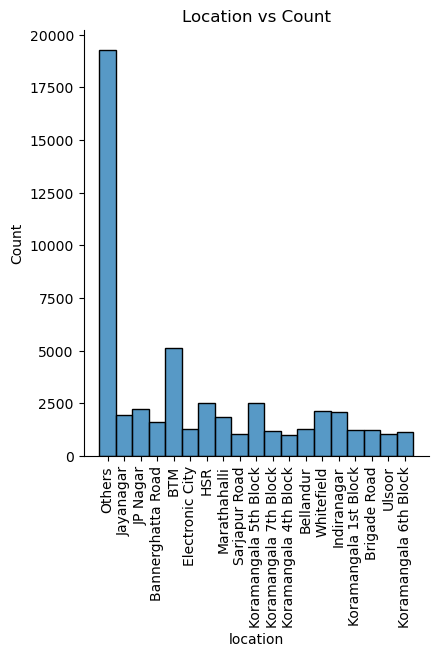

In [33]:
plt.figure(figsize=(10,30))
sns.displot(df['location'], kind="hist")
plt.title("Location vs Count")
plt.xticks(rotation=90)

In [34]:
px.pie(df, 'online_order', title='Online Order vs Dine In')

In [35]:
px.pie(df, 'rate', title='Rating')

In [36]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,2_plate_cost,listed_type
0,Jalsa,Yes,Yes,4.1,775,Others,Casual Dining,800.0,Buffet
1,Spice Elephant,Yes,No,4.1,787,Others,Casual Dining,800.0,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Others,Others,800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Others,Quick Bites,300.0,Buffet
4,Grand Village,No,No,3.8,166,Others,Casual Dining,600.0,Buffet


In [37]:
px.pie(df, 'book_table', title='Booking Table Facility')

<Axes: xlabel='online_order', ylabel='rate'>

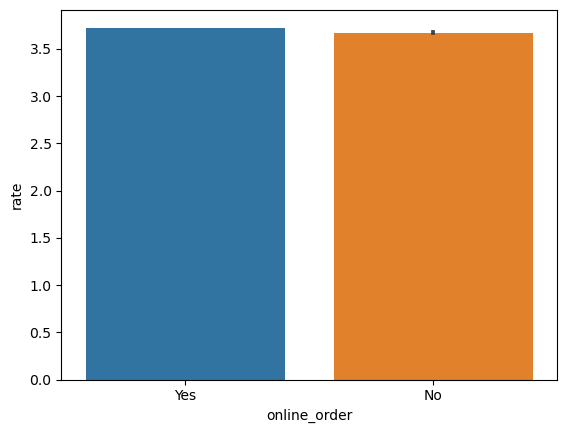

In [38]:
sns.barplot(data=df, x='online_order', y='rate')

<Axes: title={'center': 'Location vs Outlets'}, xlabel='location', ylabel='count'>

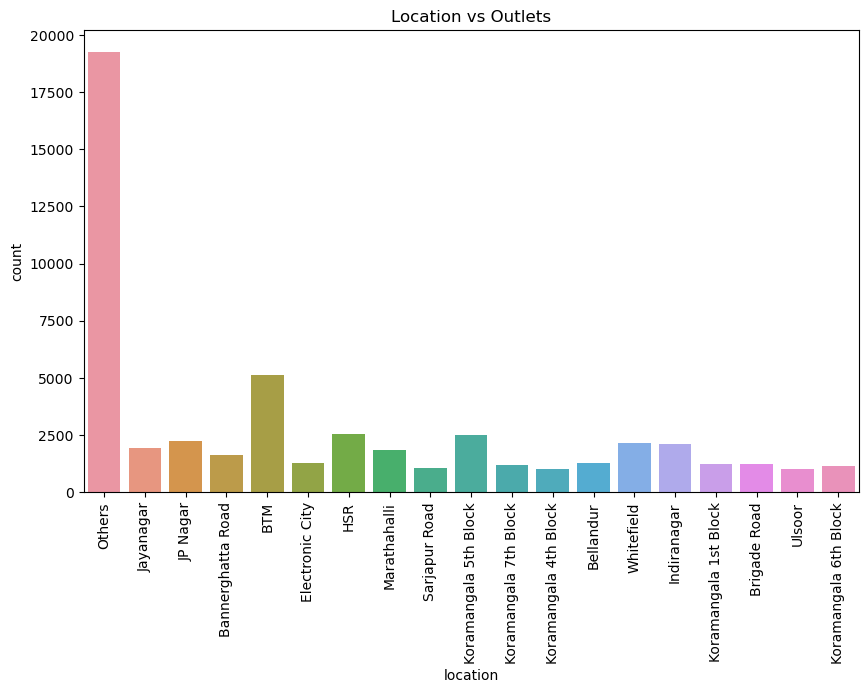

In [39]:
plt.figure(figsize=(10,6))
plt.xticks(rotation = 90)
plt.title('Location vs Outlets')
sns.countplot(x=df['location'])

<Axes: title={'center': 'Location vs Rating'}, xlabel='location', ylabel='rate'>

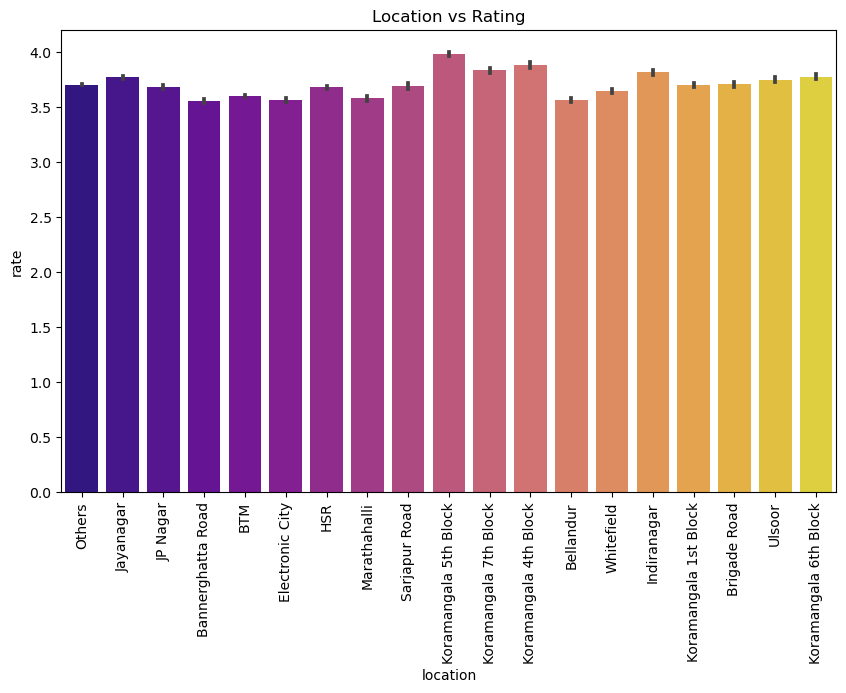

In [40]:
plt.figure(figsize=(10,6))
plt.xticks(rotation = 90)
plt.title('Location vs Rating')
sns.barplot(x=df['location'], y=df['rate'], palette='plasma')

<Axes: xlabel='rate', ylabel='Count'>

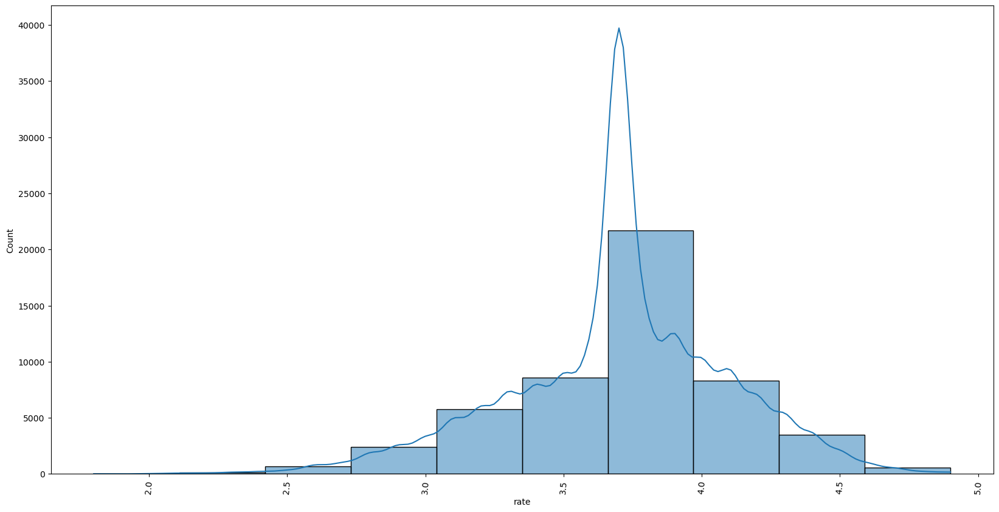

In [41]:
plt.figure(figsize=(20,10))
plt.xticks(rotation = 85)

sns.histplot(df['rate'],bins=10,kde=True)

In [42]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,2_plate_cost,listed_type
0,Jalsa,Yes,Yes,4.1,775,Others,Casual Dining,800.0,Buffet
1,Spice Elephant,Yes,No,4.1,787,Others,Casual Dining,800.0,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Others,Others,800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Others,Quick Bites,300.0,Buffet
4,Grand Village,No,No,3.8,166,Others,Casual Dining,600.0,Buffet


In [43]:
inputs=df[['name', 'online_order', 'book_table', 'location', 'rest_type', 'listed_type']]
target_rate=df['rate']
target_cost=df['2_plate_cost']

In [44]:
inputs.shape

(51717, 6)

In [45]:
numeric_col=df.select_dtypes(include=np.number).columns.tolist()
df[numeric_col].describe()

,rate,votes,2_plate_cost
count,51717.000000,51717.000000,51717.000000
mean,3.700449,283.697527,555.431566
std,0.395391,803.838853,437.380224
min,1.800000,0.000000,40.000000
25%,3.500000,7.000000,300.000000
50%,3.700449,41.000000,400.000000
75%,3.900000,198.000000,650.000000
max,4.900000,16832.000000,6000.000000


In [46]:
object_col=df.select_dtypes(include='object').columns.tolist()
df[object_col].head()

,name,online_order,book_table,location,rest_type,listed_type
0,Jalsa,Yes,Yes,Others,Casual Dining,Buffet
1,Spice Elephant,Yes,No,Others,Casual Dining,Buffet
2,San Churro Cafe,Yes,No,Others,Others,Buffet
3,Addhuri Udupi Bhojana,No,No,Others,Quick Bites,Buffet
4,Grand Village,No,No,Others,Casual Dining,Buffet


In [47]:
scaler=MinMaxScaler()

In [48]:
df[numeric_col]=scaler.fit_transform(df[numeric_col])
df[numeric_col].describe()

,rate,votes,2_plate_cost
count,51717.000000,51717.000000,51717.000000
mean,0.613048,0.016855,0.086482
std,0.127545,0.047757,0.073386
min,0.000000,0.000000,0.000000
25%,0.548387,0.000416,0.043624
50%,0.613048,0.002436,0.060403
75%,0.677419,0.011763,0.102349
max,1.000000,1.000000,1.000000


In [49]:
ohe=OneHotEncoder(sparse_output=False, handle_unknown='ignore')
ohe.fit(df[object_col])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [50]:
ohe.categories_

[array(['#FeelTheROLL', '#L-81 Cafe', '#Vibes Restro', ...,
        're:cess - Hilton Bangalore Embassy GolfLinks', 'repEAT Hub',
        'sCoolMeal'], dtype=object),
 array(['No', 'Yes'], dtype=object),
 array(['No', 'Yes'], dtype=object),
 array(['BTM', 'Bannerghatta Road', 'Bellandur', 'Brigade Road',
        'Electronic City', 'HSR', 'Indiranagar', 'JP Nagar', 'Jayanagar',
        'Koramangala 1st Block', 'Koramangala 4th Block',
        'Koramangala 5th Block', 'Koramangala 6th Block',
        'Koramangala 7th Block', 'Marathahalli', 'Others', 'Sarjapur Road',
        'Ulsoor', 'Whitefield'], dtype=object),
 array(['Bakery', 'Cafe', 'Casual Dining', 'Casual Dining, Bar',
        'Delivery', 'Dessert Parlor', 'Others', 'Quick Bites',
        'Takeaway, Delivery'], dtype=object),
 array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
        'Drinks & nightlife', 'Pubs and bars'], dtype=object)]

In [51]:
encoded_cols=list(ohe.get_feature_names_out(object_col))
print(encoded_cols)

['name_#FeelTheROLL', 'name_#L-81 Cafe', 'name_#Vibes Restro', 'name_#refuel', "name_'Brahmins' Thatte Idli", 'name_1 Fahreheit', 'name_1000 B.C', 'name_100Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â°C', 'name_11 to 11 Express Biriyanis', 'name_1131 Bar + Kitchen', 'name_12th Main - Grand Mercure', 'name_1441 Pizzeria', 'name_1522 - The Pub', 'name_154 Breakfast Club', 'name_1722 Urban Bistro', 'name_18+ Ice Cafe', 'name_1947', 'name_1980s Games Cafe', 'name_1992 Chats - Space', 'name_1Q1', 'name_1TO3 Kitchen', 'name_2 Statez', 'name_20 Char - Sterlings MAC Hotel', 'name_20 Feet High', 'name_21 C - La Marvella Sarovar Premiere Hotel', 'name_21 Corner Haus Cafe', 'name_22S', 'name_24 Carats - The Capitol', 'name_24 Hours Cake Delivery', 'name_24 Hours Coffee Drop - La Classic', 'name_24/7 - The Lalit Ashok Bangalore', 'name_24/7 Food Service', 'name_24@43 - The Oterra', 'name_24th Main', 'name_29 Degrees North', 'name_2nd Home Restaurant', 'name_3 Leafs'

In [52]:
df[encoded_cols]=ohe.transform(df[object_col])

/tmp/ipykernel_20/2100291563.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_20/2100291563.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_20/2100291563.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_20/2100291563.py:1: PerformanceWarning:

Da

In [53]:
pd.set_option('Display.max_columns', None)

In [54]:
inputs=df[encoded_cols]
target_rate=df['rate']
target_cost=df['2_plate_cost']

In [55]:
inputs.shape

(51717, 8831)

In [56]:
target_rate.shape

(51717,)

In [57]:
target_cost.shape

(51717,)

In [58]:
inputs_train, inputs_test, target_rate, target_test=train_test_split(inputs, target_rate, test_size=0.3)

In [59]:
inputs_train

,name_#FeelTheROLL,name_#L-81 Cafe,name_#Vibes Restro,name_#refuel,name_'Brahmins' Thatte Idli,name_1 Fahreheit,name_1000 B.C,name_100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C,name_11 to 11 Express Biriyanis,name_1131 Bar + Kitchen,name_12th Main - Grand Mercure,name_1441 Pizzeria,name_1522 - The Pub,name_154 Breakfast Club,name_1722 Urban Bistro,name_18+ Ice Cafe,name_1947,name_1980s Games Cafe,name_1992 Chats - Space,name_1Q1,name_1TO3 Kitchen,name_2 Statez,name_20 Char - Sterlings MAC Hotel,name_20 Feet High,name_21 C - La Marvella Sarovar Premiere Hotel,name_21 Corner Haus Cafe,name_22S,name_24 Carats - The Capitol,name_24 Hours Cake Delivery,name_24 Hours Coffee Drop - La Classic,name_24/7 - The Lalit Ashok Bangalore,name_24/7 Food Service,name_24@43 - The Oterra,name_24th Main,name_29 Degrees North,name_2nd Home Restaurant,name_3 Leafs,name_3 Spice,name_30 Square,name_360 Atoms Restaurant And Cafe,name_36th Cross Coffee Mane,name_37 China Town,name_38 Sugar Lane,"name_3B's - Buddies, Bar & Barbecues",name_3G's - Gulp & Groove,name_3ice Cubes,name_3rd Innings,name_4 Mangoes,name_4 Seasons Restaurant,name_4 States,name_4-States,name_46 Ounces Brewgarden,name_4671 Indian Coastal Cuisine,name_4700BC Popcorn,name_4Foodiez,name_4Foodiez - The Restaurant,name_4K Biryani,name_4S Bar,name_4th Tea Block,name_5 Degree Centigrade,name_5 Star Food,name_5 star food,name_50-50 EATING HOUSE,name_52 Wall Street,name_55 Wall Street,name_56 Bhoga Sweets,name_5th Main Cafe,name_7 Days Restaurant,name_7 Degrees North,name_7 Hills Andhra Mess,name_7 Hills Garden Restaurant,name_7 Hills Restaurant,name_7 Plates,name_7 Shanghai,name_7 Spice,name_7 Star Biryani,name_7 to 11 Food Court,name_70 Brigade - Iris Hotel,name_7Biryanis,name_7th Heaven,name_8 Slice,name_9 Bowls,name_9 Tea,name_90's,name_90's Beer Cafe - Hotel Millennium Plaza,name_90's Cafe,name_99 Caffe,name_99 Eat Out,name_99 Pancakes,name_99 Udupi Veg,name_99 Variety Dosa & Pav Bhaji,name_99 Variety Dosa and Pav Bhaji,name_99 Variety Dose-Biryanis-Starters,name_99Foods,name_9D Foods,name_9th Cross Cafe,name_@ Biryani Central,name_@ The Bbq,name_@99,name_@Italy,name_@North Parontha Hut,name_A 1 Pizza and Food,name_A Baker's Confession,name_A Bar,name_A Hole Lotta Love Cafe,name_A La Carte Restaurant,name_A Little For Love,name_A M Biryani Hotel,name_A Pinch Of Magic,name_A Southern Fair,name_A Today Thick Shakes,name_A-1 Chicken Biriyani & Kababs,name_A-1 Fast Food,name_A-one Dum Biryani,name_A.M New Punjab Food Corner,name_A1 Ambur Biryani,name_A1 Ambur Dum Biryani And Parota Centre,name_A1 Biriyani Point,name_A1 Express,name_A1 Garam Masala,name_A1 Hot Dum Biryani,name_A1 Spice Inn,name_A1 Tasty Lime Rice,name_A2B - Adyar Ananda Bhavan,name_A2B Veg - Adyar Ananda Bhavan,name_A3 Nuwang Kitchen,name_AAR Chinese And Grill Food Truck,name_AAlvina Restaurant,name_AB Cafe,name_AB's - Absolute Barbecues,name_ABC Grand,name_ABCD - Anybody Can Dine,name_ABY?s Kitchen,name_AJ Ambur Star Biriyani,name_AKS Family Dhaba And Restaurant,name_AKSHAYA BIRYANI,name_AL - Khair,name_AL Afreen's Biryani Paradise,name_AL Habeeb Restaurant,name_AL-Nabi Hotel,name_AM Biryani Junction,name_AM WOW,name_AM's Cafe Recreate,name_AMBUR HOT DUM BIRYANI,name_ANR Dum Biryani Centre,name_ANTIGRAVITY,name_AQNI,name_ARB Restaurant,name_ASEAN - On The Edge,name_ASIA SEVEN,name_AULI,name_Aaccord Restaurant,name_Aadhya Hotel,name_Aadhya's Fresh and Rich,name_Aadvik Nightfood,name_Aafa Calicut Restaurant,name_Aagaman Veg,name_Aaha,name_Aaha Andhra,name_Aahar,name_Aahar Cafe,name_Aahar Vihar,name_Aahara,name_Aahara Vihar,name_Aaharaa,name_Aaharam,name_Aalishan Restaurant & Caterer,name_Aamaravathi Biryani Zone,name_Aami Bangali,name_Aami Kolkata,name_Aao G Khao G,name_Aapni Rasoi,name_Aaranya Restaurant,name_Aarti Paratha & Rolls Corner,name_Aarush's Food Plaza,name_Aarya Pork Hotel,name_Aashirvaad Restaurant,name_Aashish Foods,name_Aasife & Brothers Biriyani Centre,name_Aastha Bengali Mess,name_Aata's Kitchen,name_Aathithya,name_A

In [60]:
def rmse(target, prediction):
    return np.sqrt(np.mean(np.square(target-prediction)))

In [61]:
model=LinearRegression().fit(inputs_train, target_rate)
prediction=model.predict(inputs_test)

In [62]:
loss_rate=rmse(target_test, prediction)

In [63]:
loss_rate

1396273415.8007655

In [64]:
puts_train, inputs_test, target_cost, target_test=train_test_split(inputs, target_cost, test_size=0.3)

In [65]:
model=LinearRegression().fit(inputs_train, target_cost)
prediction=model.predict(inputs_test)

In [66]:
loss_cost=rmse(target_test, prediction)

In [67]:
loss_cost

925029401.371389